## nonparametric stat inf

generative model: 
generate a given network given a node partition into groups 
using bayes: can obtain likelihood of a partition given a network 

## MDL 

calculating that probability is equivalent to finding the simplest partition that correspond to the network.

the more likely a partition given a network, the lowest the description length of the network: the least information required to describe the network 
https://docs.oracle.com/database/121/DMCON/GUID-96A38D67-2F09-4659-976D-4DDF478555E0.htm#DMCON563


## SBM

given a node partitions and a count of edges within groups, SBM generates a network with random links 

sbm allows community finding but also other structures such as biparty networks when nodes only/mostly connect to nodes from other groups 

a parameter can be added to account for the heterogenous degree distributions of links within the same groups: all nodes of a group dont have the same amount of links.

SBM mostly finds big groups, by generating SBM for these groups iteratively in a nested structure smaller groups can be found


## inferring best partition




In [6]:
from graph_tool.all import *
import graph_tool.all as gt

import matplotlib.pyplot as plt

import numpy as np


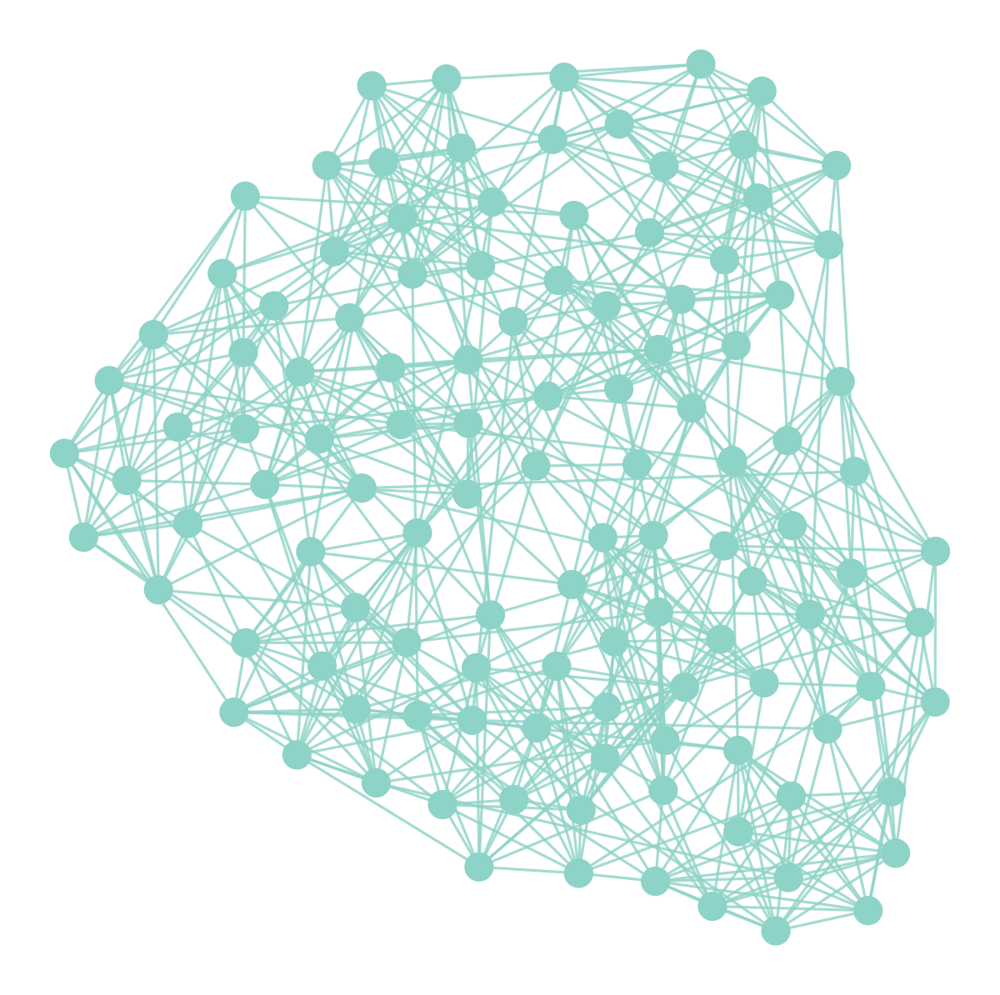

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x164a159a0, at 0x164a1e160>

In [71]:
g = gt.collection.data["football"]
state = gt.BlockState(g)
state.draw()


In [55]:
print(state.get_B())
print(state.get_nonempty_B())
print(state.entropy())
print(state.get_er())
print(state.get_nr())
print(state.get_E())
print(state.get_N())
print(state.get_rec_params())



1
1
2035.4274450408707
<VertexPropertyMap object with value type 'int32_t', for Graph 0x165963c10, at 0x1659637f0>
<VertexPropertyMap object with value type 'int32_t', for Graph 0x165963c10, at 0x1659508e0>
613
115
[]


In [73]:
state.multiflip_mcmc_sweep(niter=1)

(-32.74967388093789, 2253, 558)

116
2
2002.6777711599334
<VertexPropertyMap object with value type 'int32_t', for Graph 0x165810100, at 0x165810910>
<VertexPropertyMap object with value type 'int32_t', for Graph 0x165810100, at 0x1661d5c40>
613
115
[]


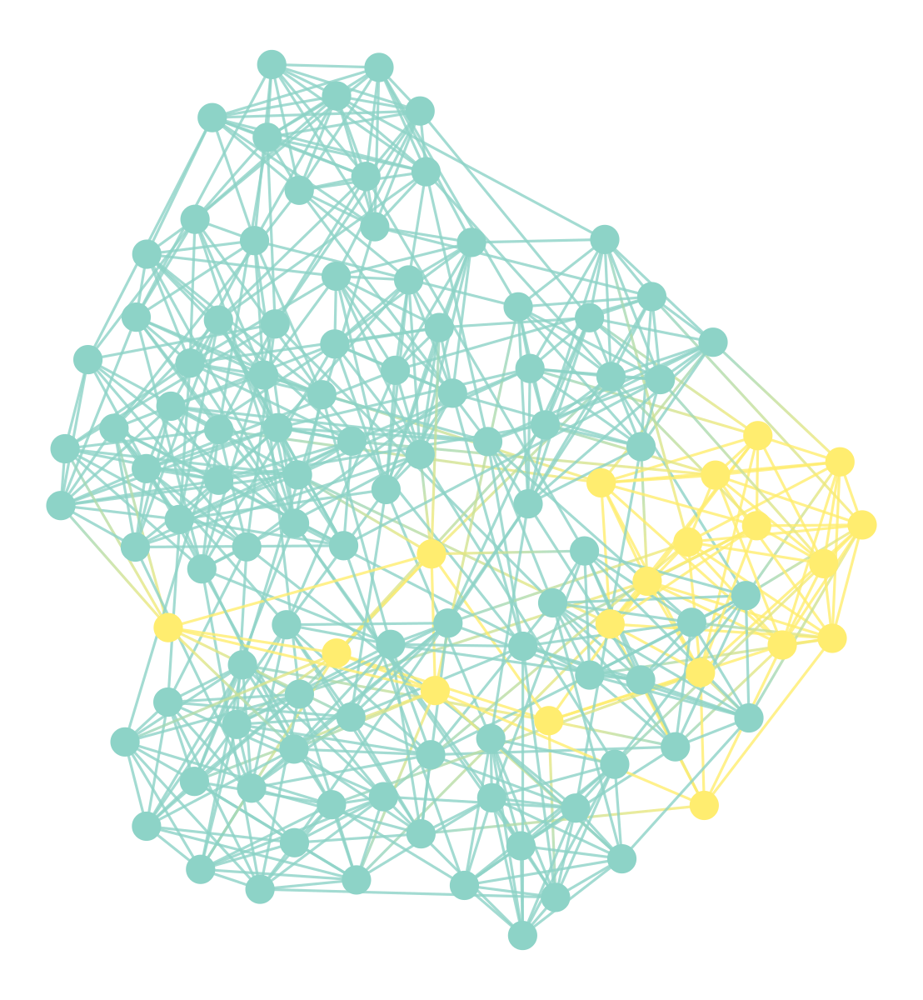

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x164a159a0, at 0x1661c7dc0>

In [75]:
print(state.get_B())
print(state.get_nonempty_B())
print(state.entropy())
print(state.get_er())
print(state.get_nr())
print(state.get_E())
print(state.get_N())
print(state.get_rec_params())
state.draw()


### sbm adjacency matrix and generating graph

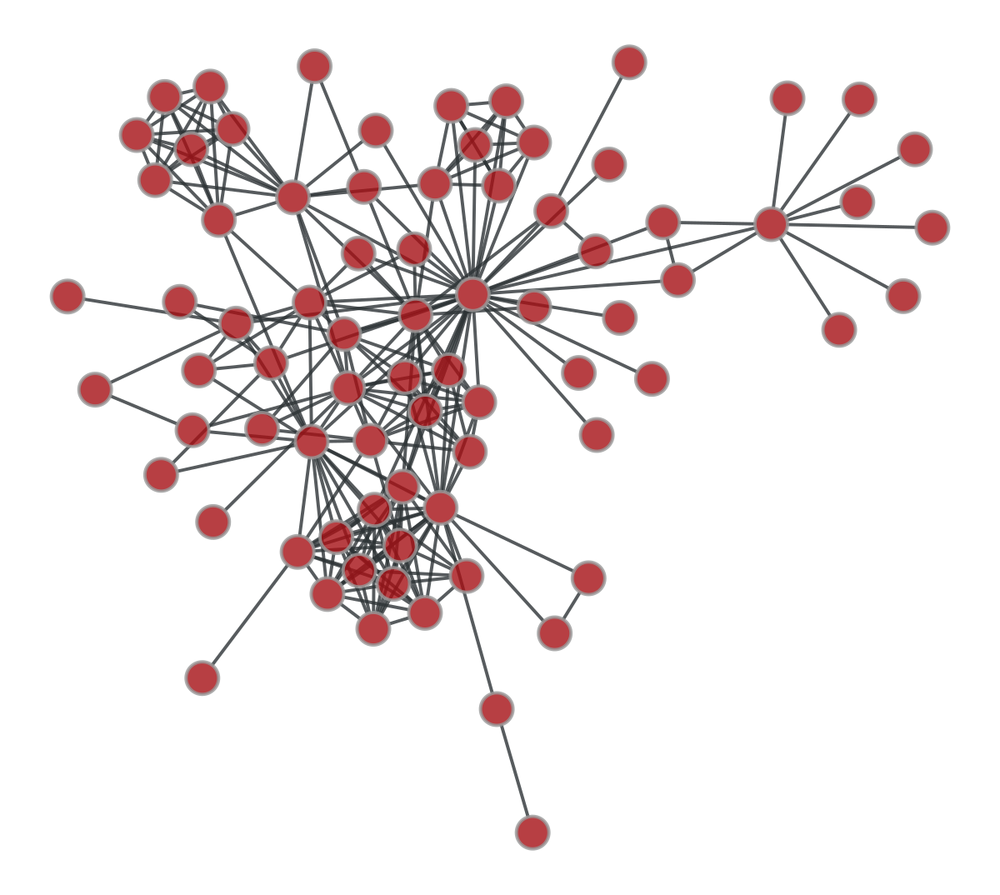

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x16930c7c0, at 0x1692c6df0>

In [5]:
g = graph_tool.collection.data["lesmis"]
graph_draw(g,pos=g.vp.pos)

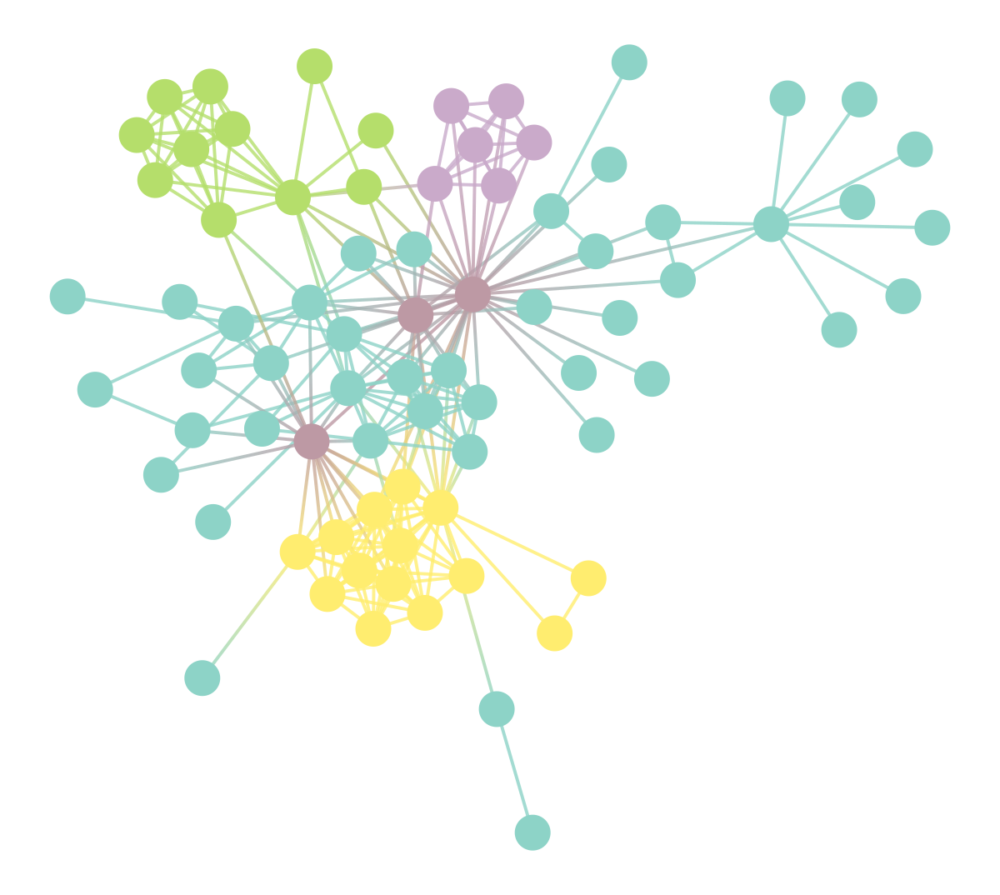

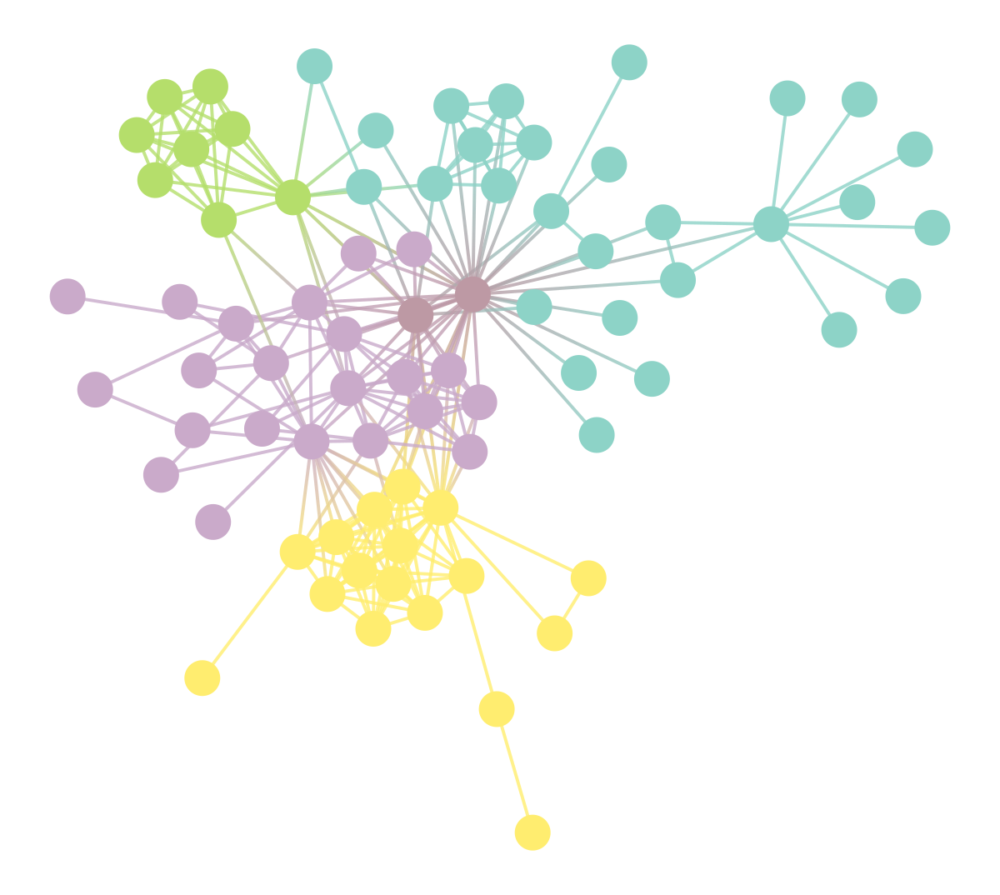

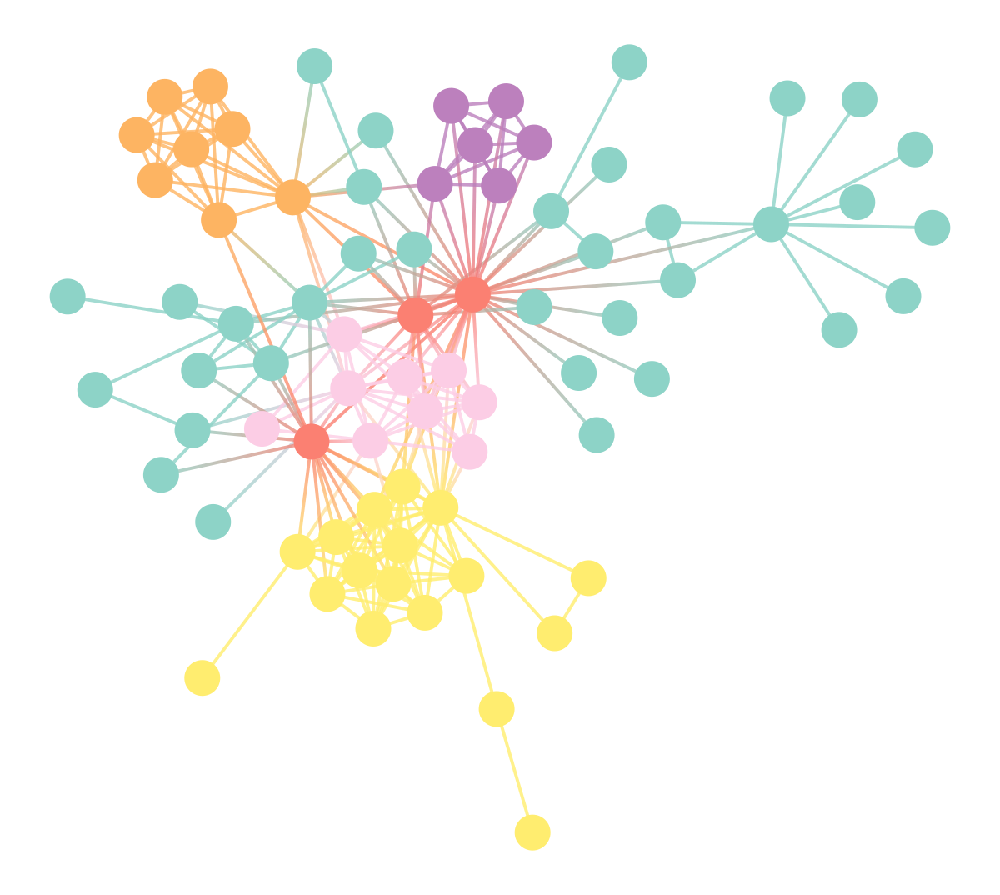

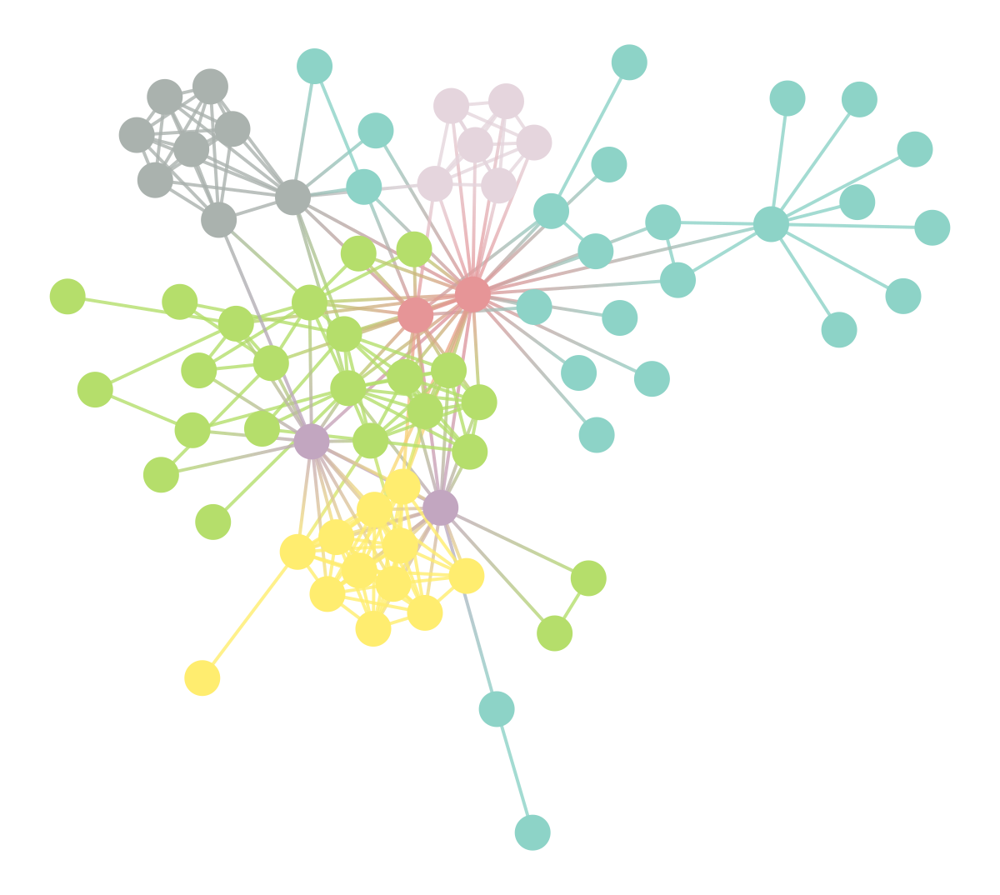

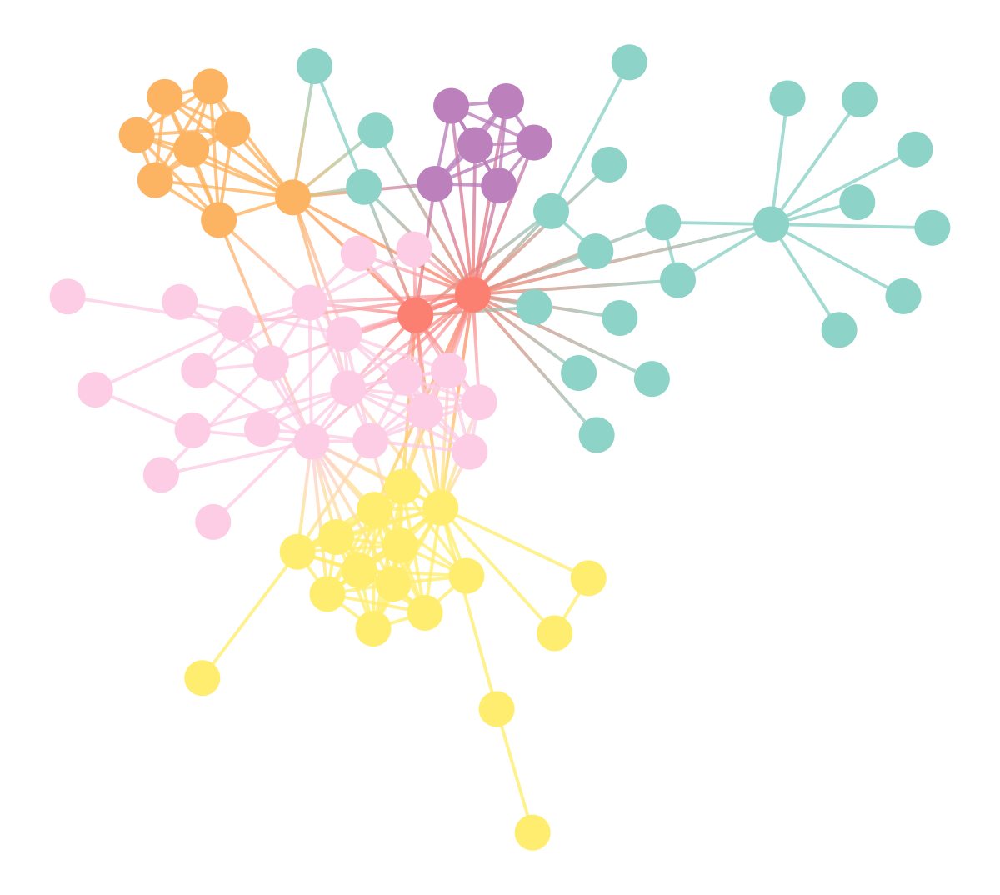

In [6]:
for i in range(5):
    state = minimize_blockmodel_dl(g)
    state.draw(pos=g.vp.pos)

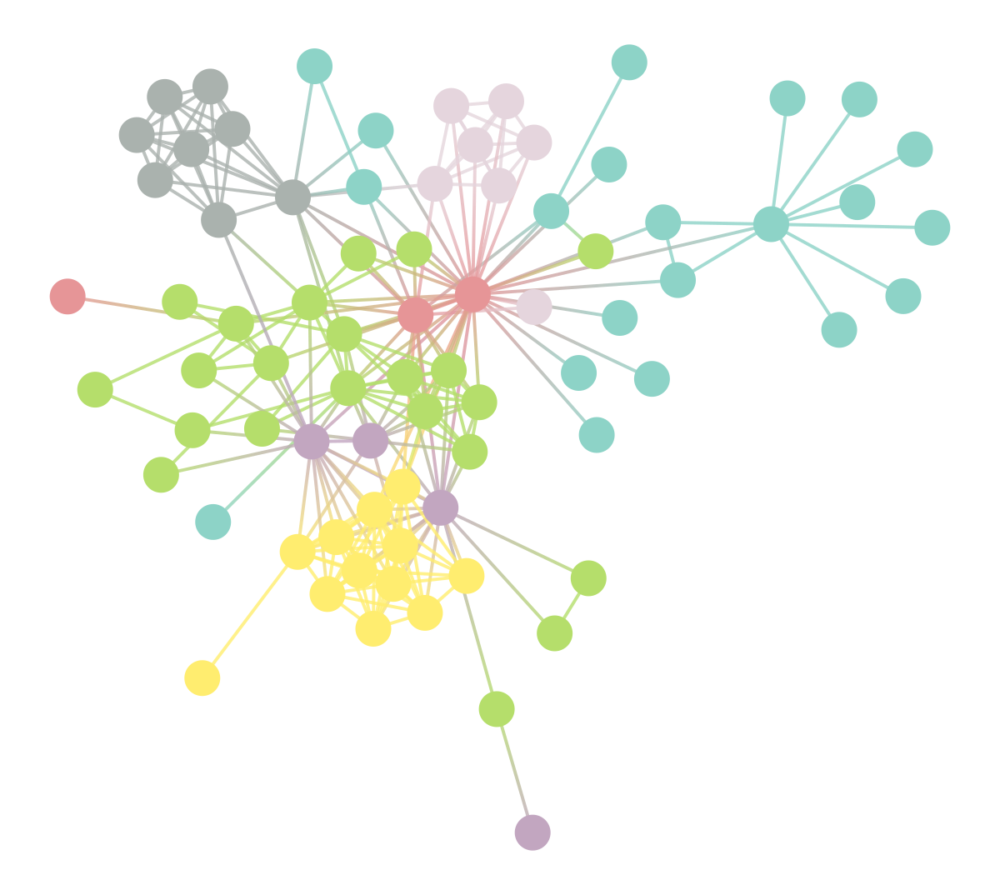

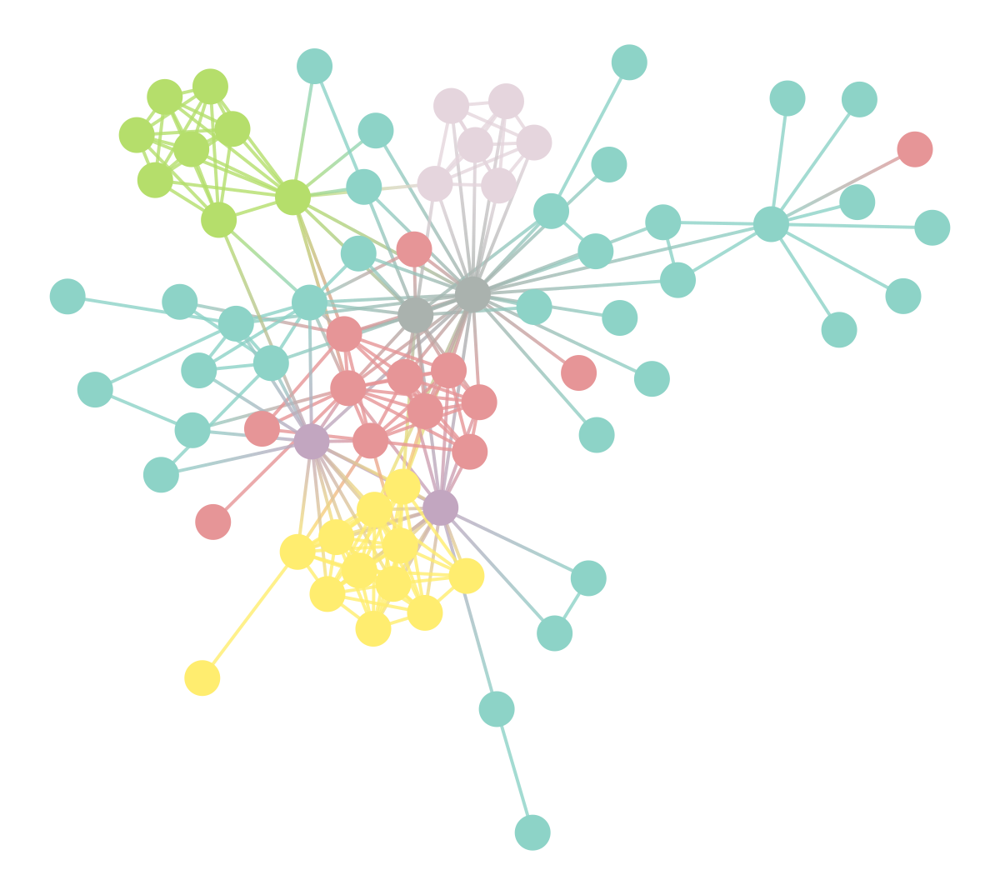

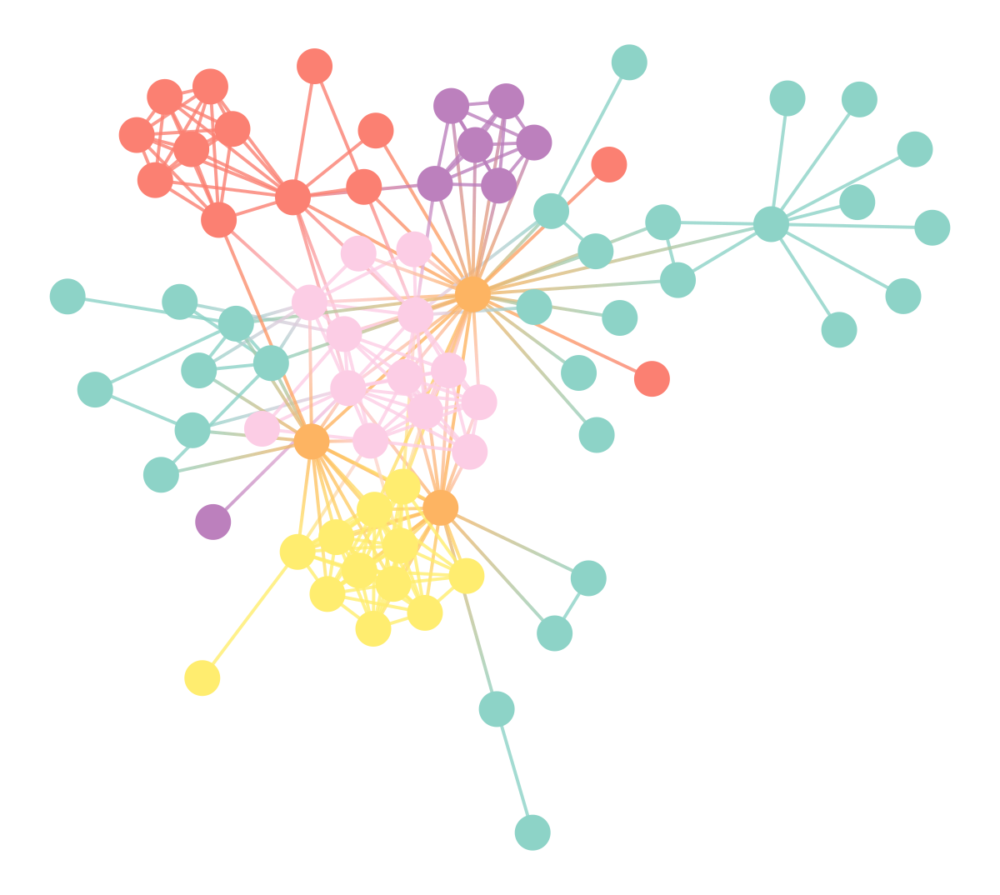

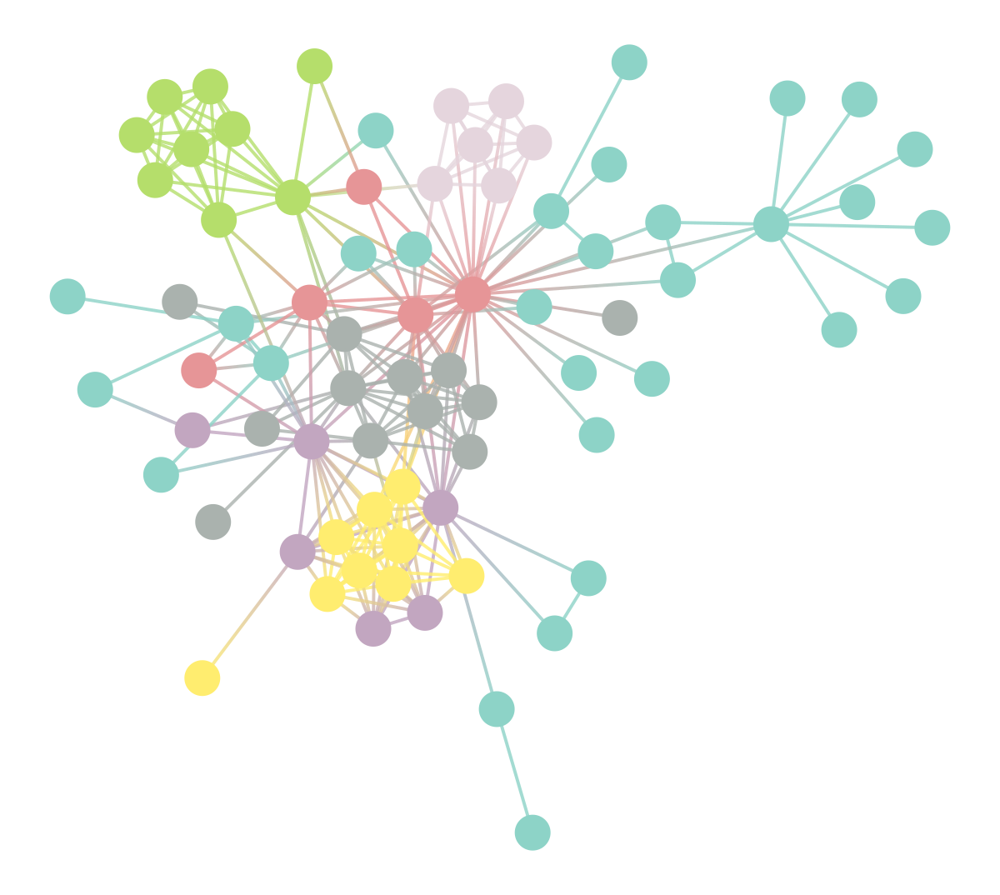

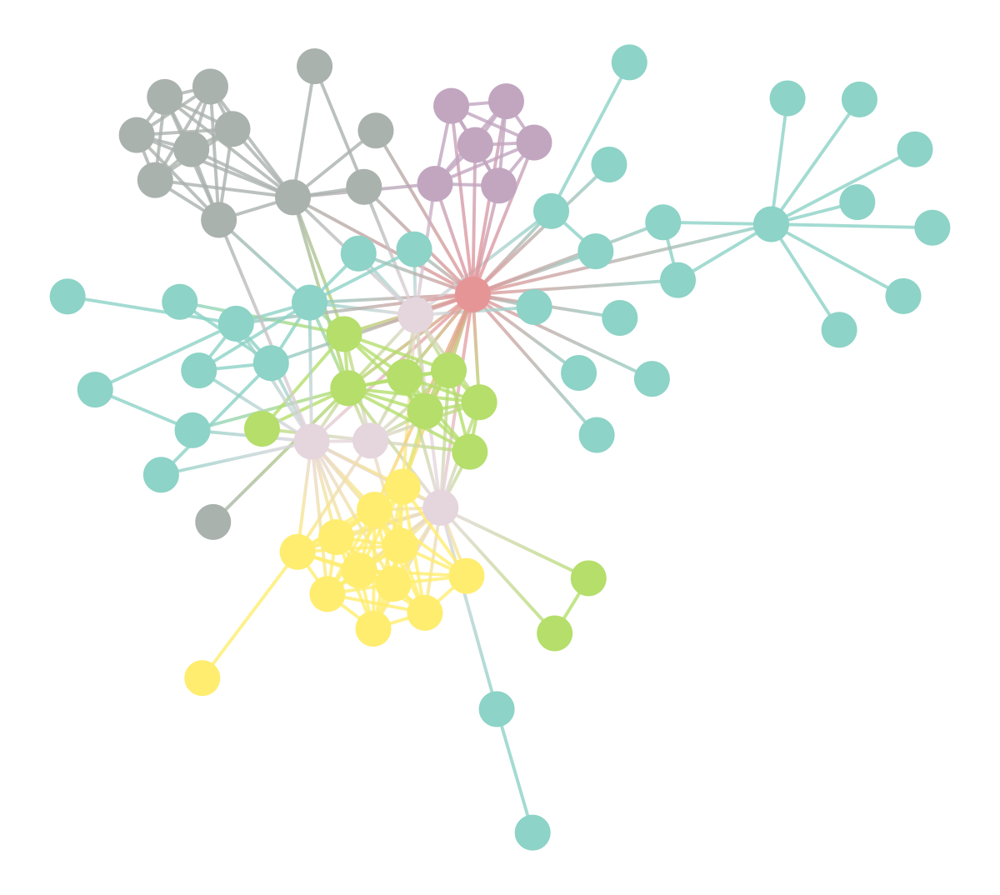

In [12]:
for i in range(5):
    state = minimize_blockmodel_dl(g)
    state.mcmc_sweep(niter=1000)
    state.draw(pos=g.vp.pos)

### merge-split difference

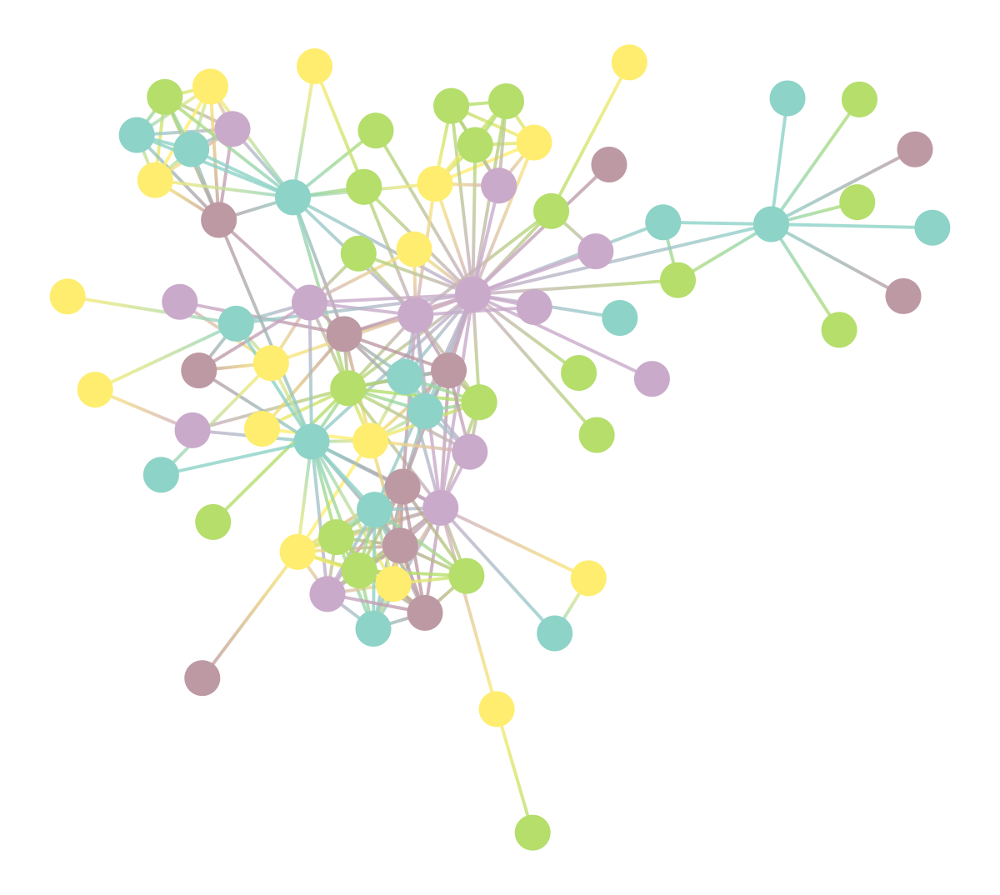

254
5
4.882398481889562
928.7346766474554


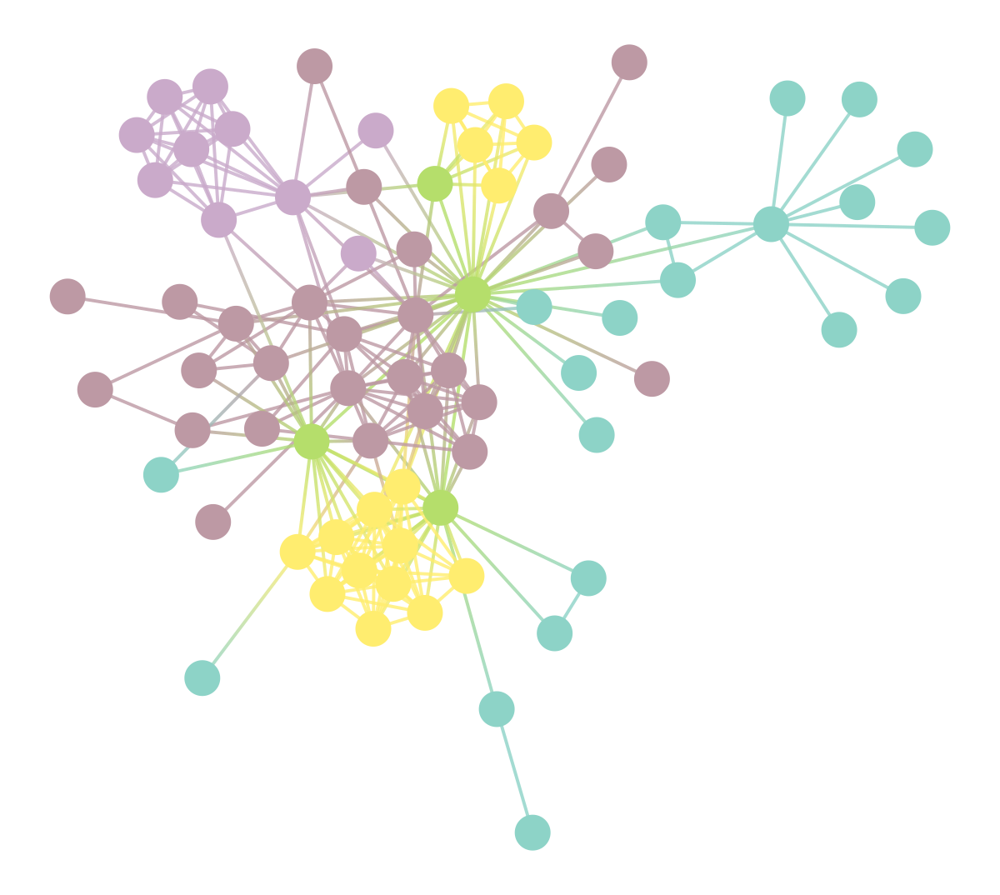

254
6
4.318186133821381
741.8188188429804


<Figure size 432x288 with 0 Axes>

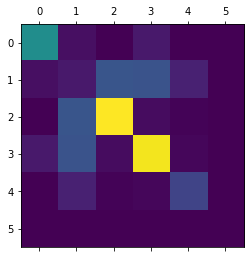

In [16]:
state = BlockState(g, B=5, deg_corr=True)
state.draw(pos=g.vp.pos)
print(state.get_E())
print(state.get_B())
print(state.get_Be())
print(state.entropy())
state.mcmc_sweep(niter=1000)

m = state.get_matrix()
plt.figure()
plt.matshow(m.todense())
state.draw(pos=g.vp.pos)
print(state.get_E())
print(state.get_B())
print(state.get_Be())
print(state.entropy())

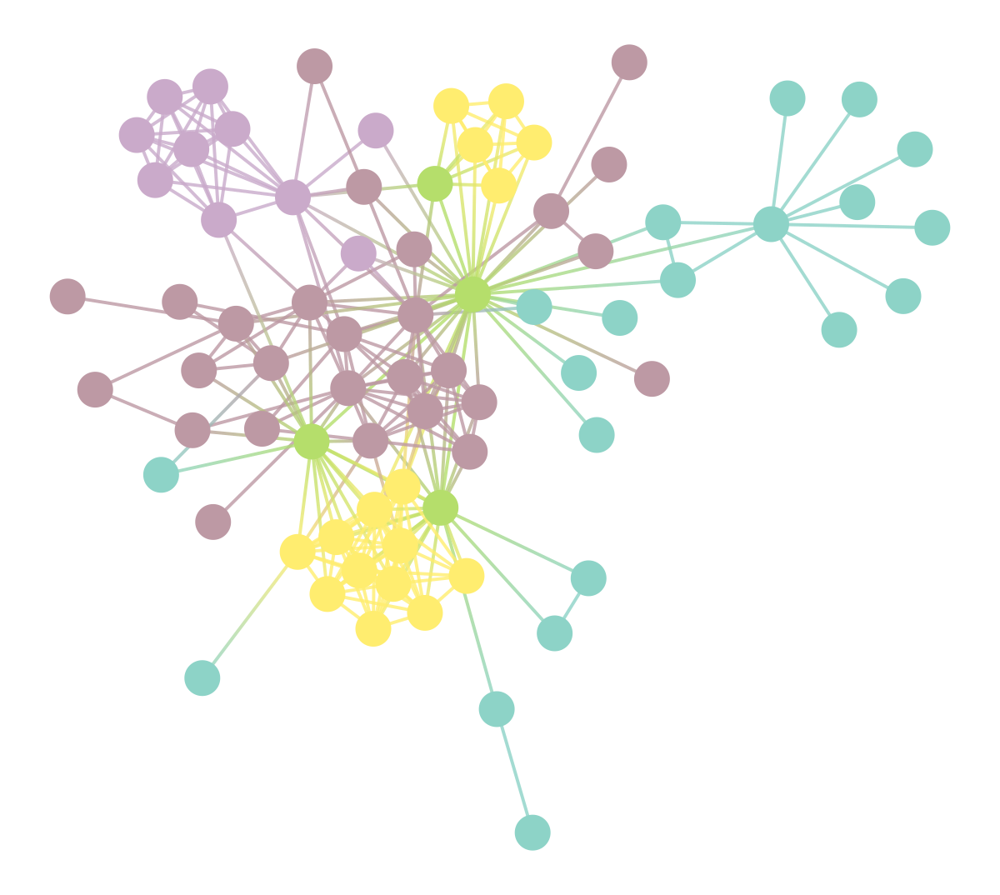

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x16930c7c0, at 0x16955ae80>

In [18]:
state.draw(pos=g.vp.pos)






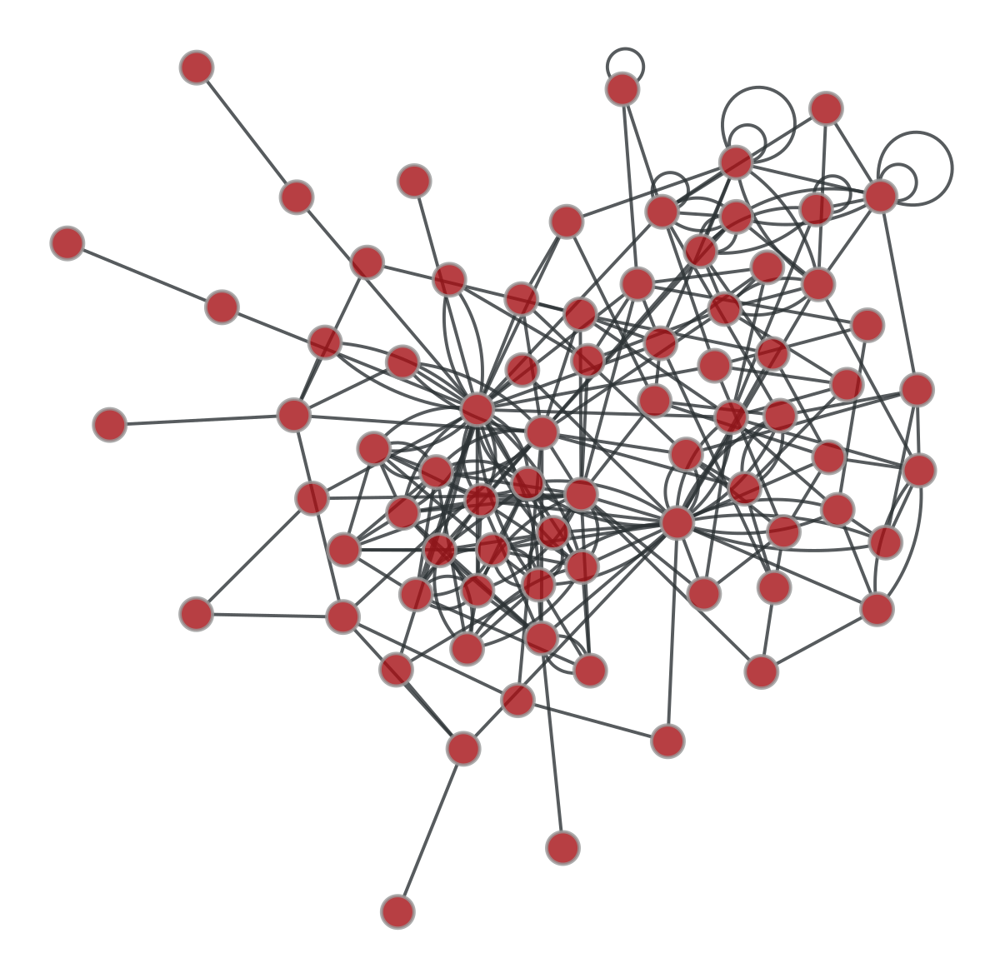

<Graph object, undirected, with 77 vertices and 254 edges, 2 internal vertex properties, 1 internal edge property, 2 internal graph properties, at 0x16930c7c0>
<Graph object, undirected, with 77 vertices and 262 edges, at 0x169568fd0>


In [17]:
sbmG = generate_sbm(state.b.a,m)
graph_draw(sbmG)
print(g)
print(sbmG)

787.4999819793873


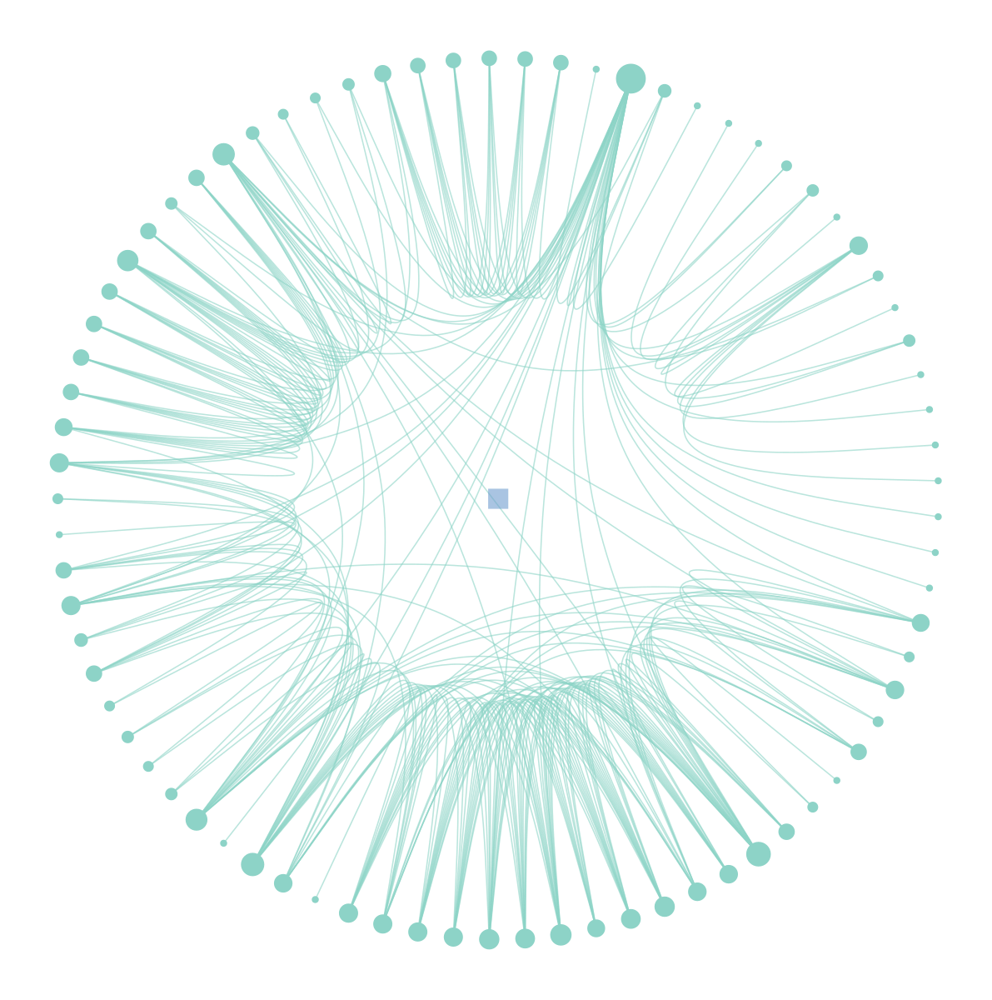

719.1656502284251


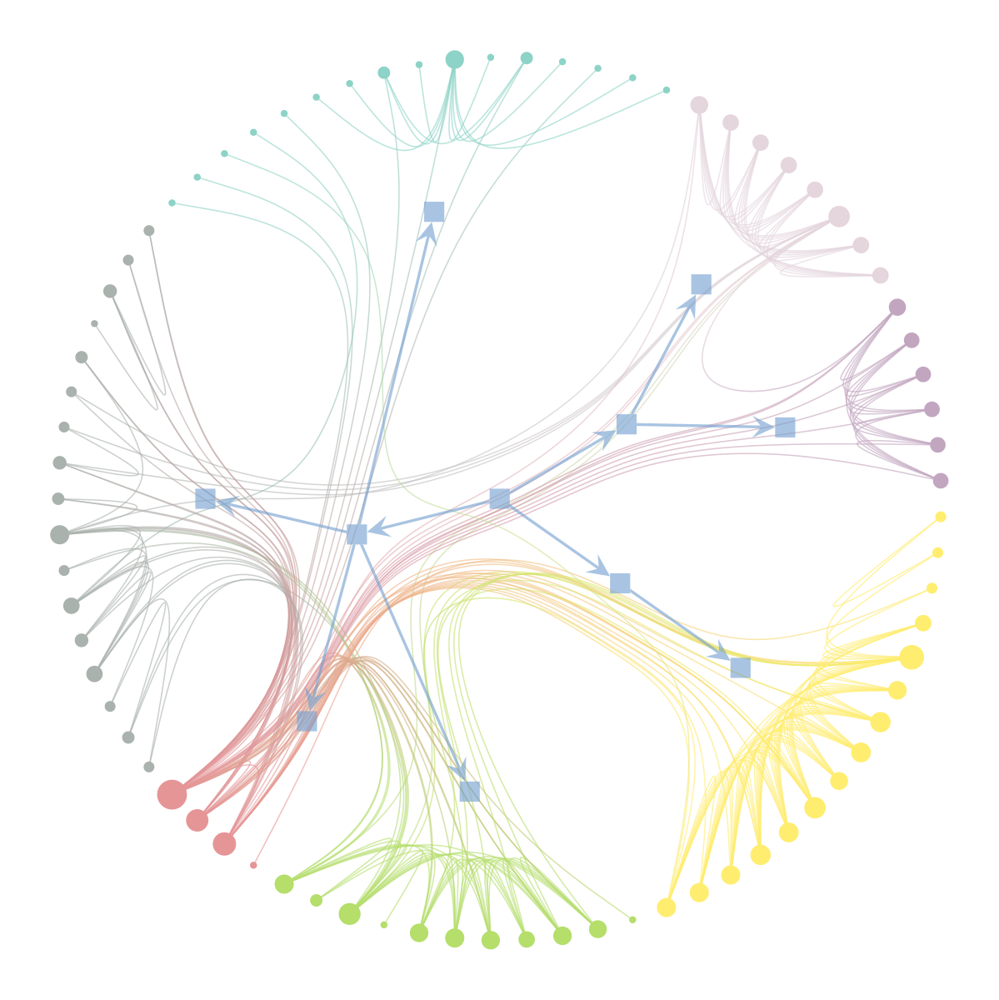

Mode 0 with size 0.5866666666666667


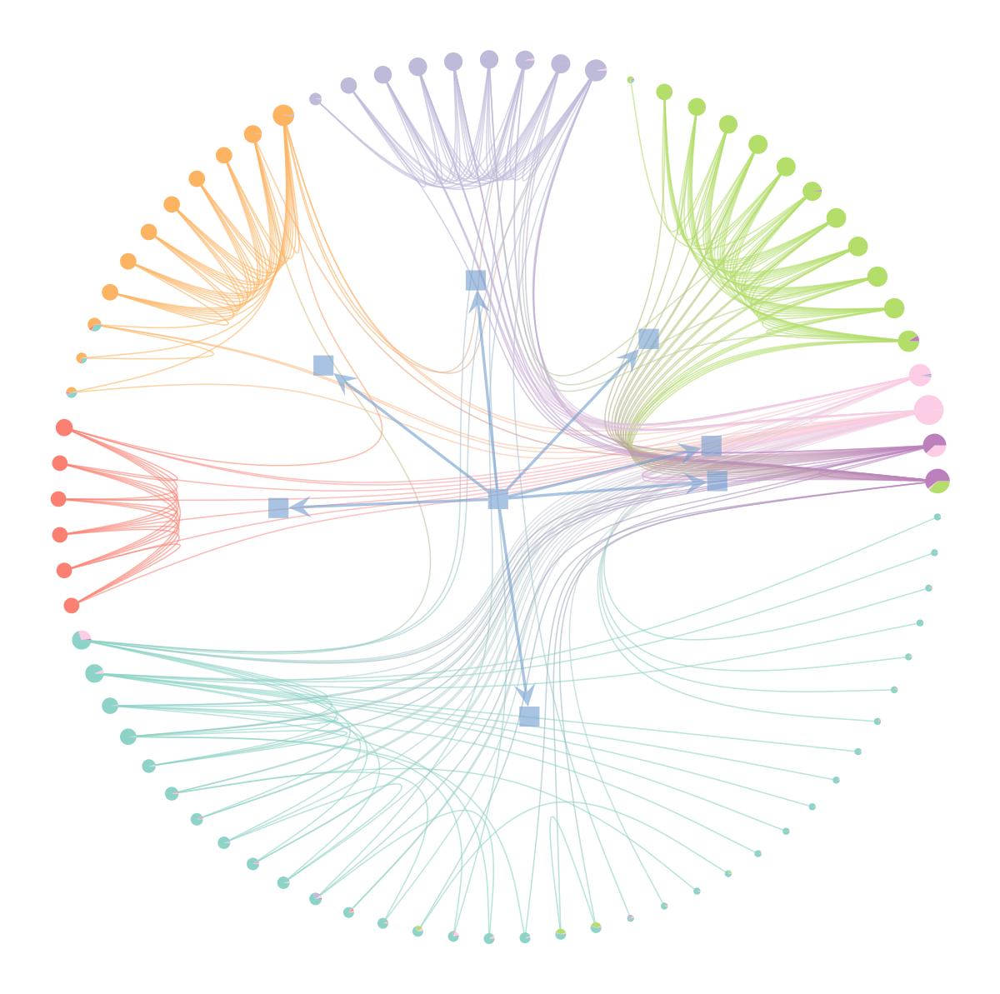

Mode 1 with size 0.31333333333333335


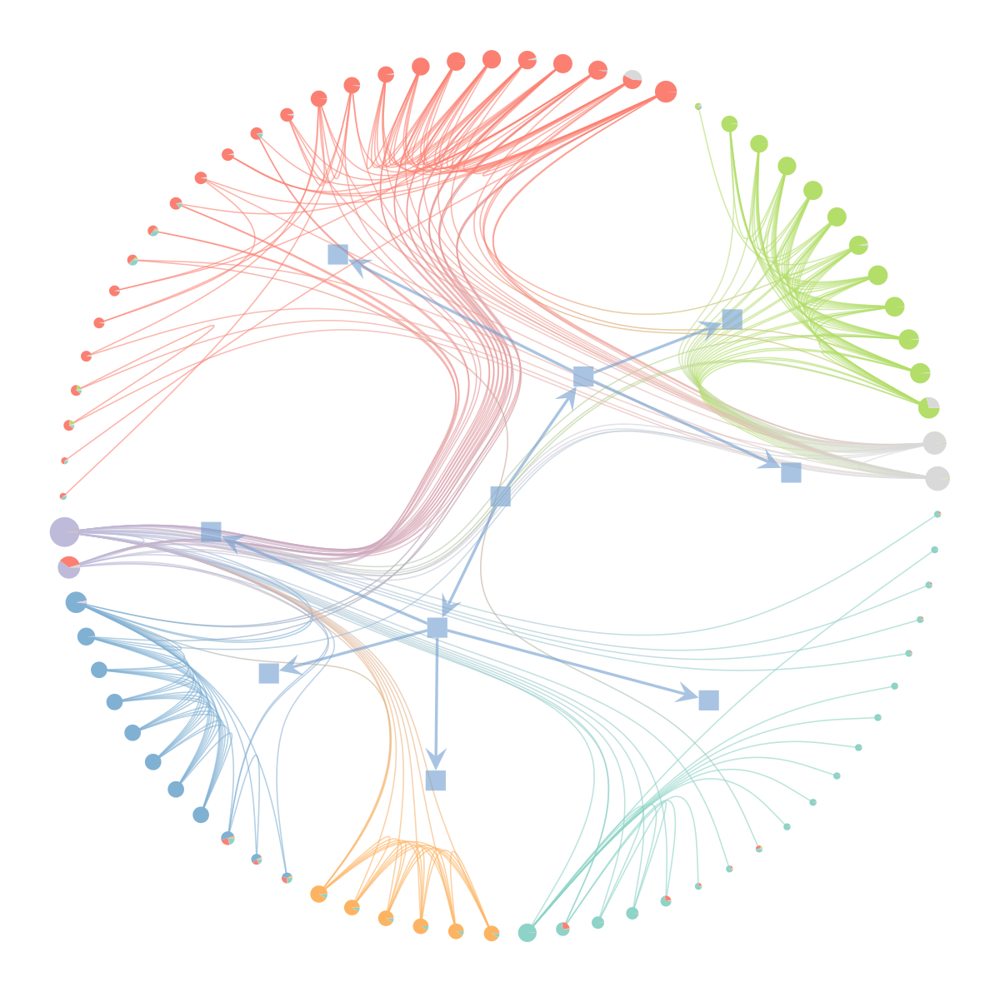

Mode 2 with size 0.0811111111111111


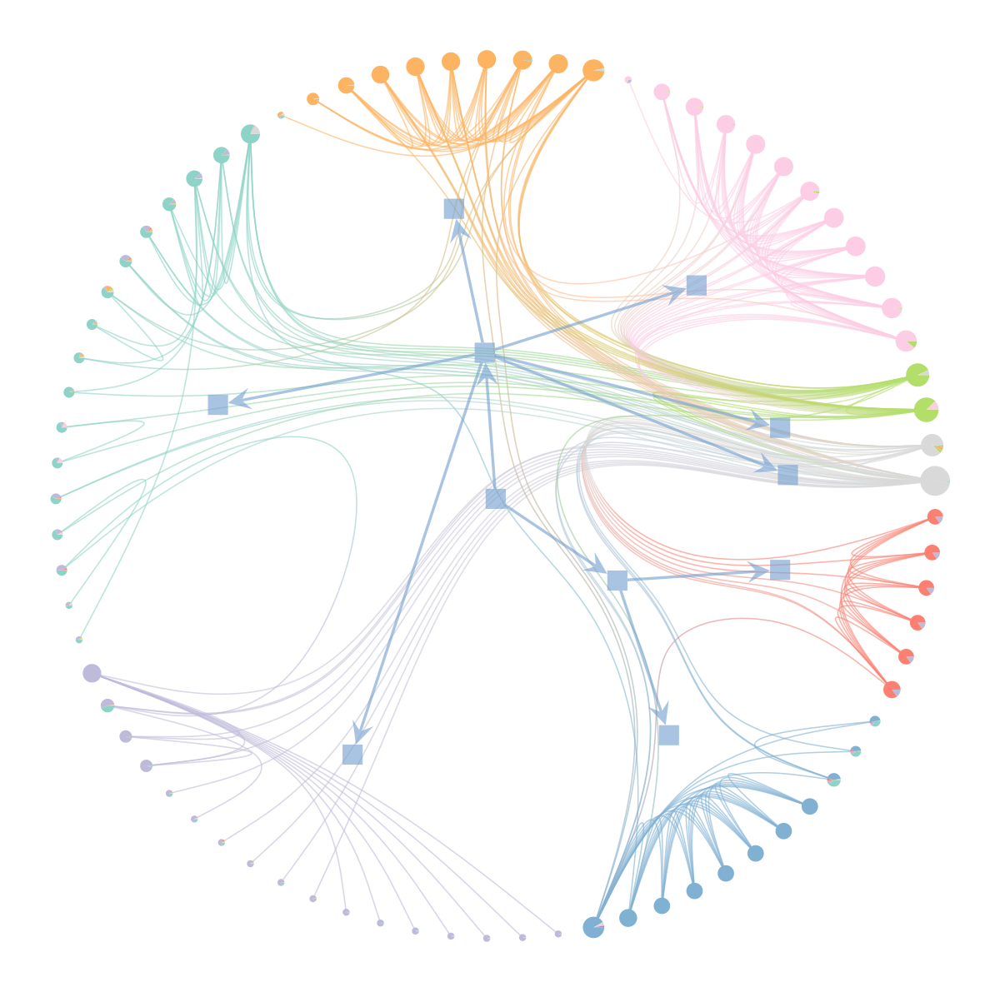

Mode 3 with size 0.01888888888888889


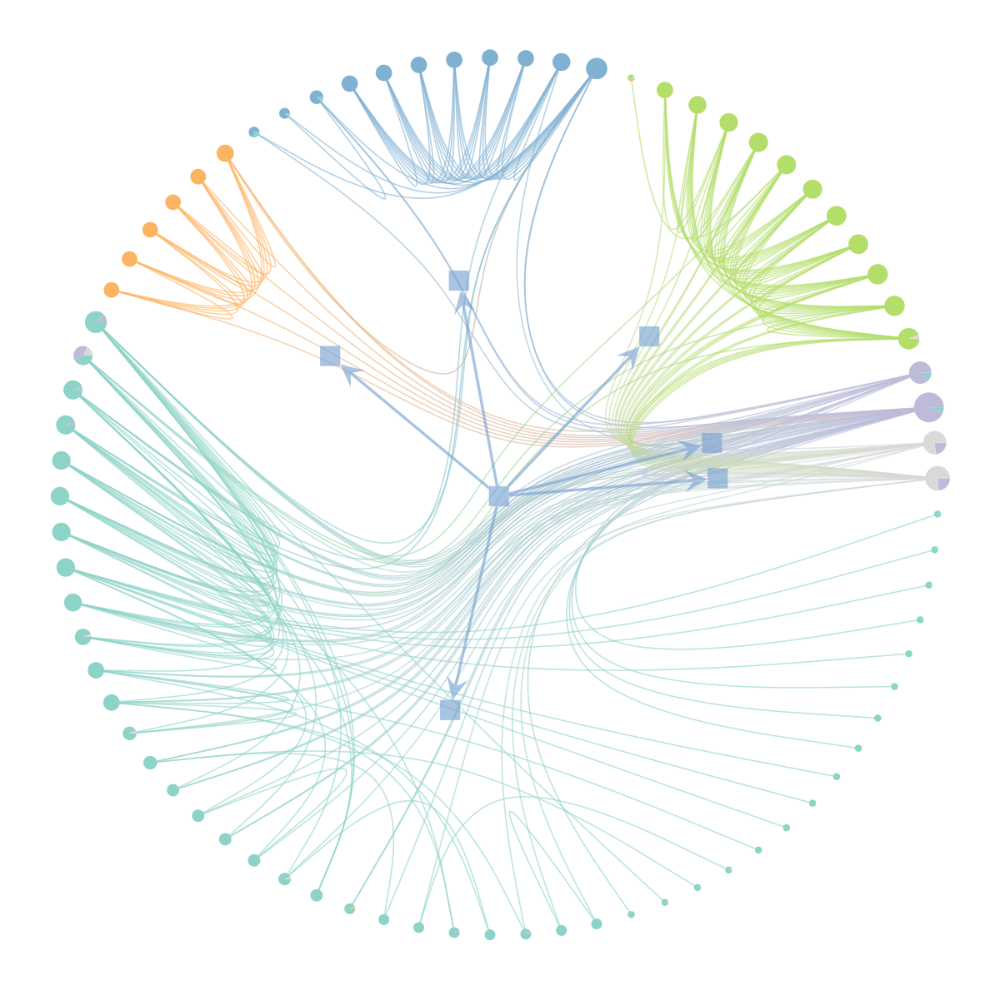

In [45]:
state = NestedBlockState(g)
print(state.entropy())
state.draw(pos=g.vp.pos)
# for i in range(100):
#     state.multiflip_mcmc_sweep(niter=10)

bs = []

def collect_partitions(s):
   global bs
   bs.append(s.get_bs())
    
for i in range(100):
    mcmc_equilibrate(state, force_niter=10, mcmc_args=dict(niter=10),
                    callback=collect_partitions)
print(state.entropy())
state.draw(pos=g.vp.pos)


# Infer partition modes
pmode = ModeClusterState(bs, nested=True)

# Minimize the mode state itself
mcmc_equilibrate(pmode, wait=1, mcmc_args=dict(niter=1, beta=np.inf))

# Get inferred modes
modes = pmode.get_modes()
modes = pmode.get_modes()

for i, mode in enumerate(modes):
    b = mode.get_max_nested()    # mode's maximum
    pv = mode.get_marginal(g)    # mode's marginal distribution

    print(f"Mode {i} with size {mode.get_M()/len(bs)}")
    state = state.copy(bs=b)
    state.draw(vertex_shape="pie", vertex_pie_fractions=pv)

704.7910310477627


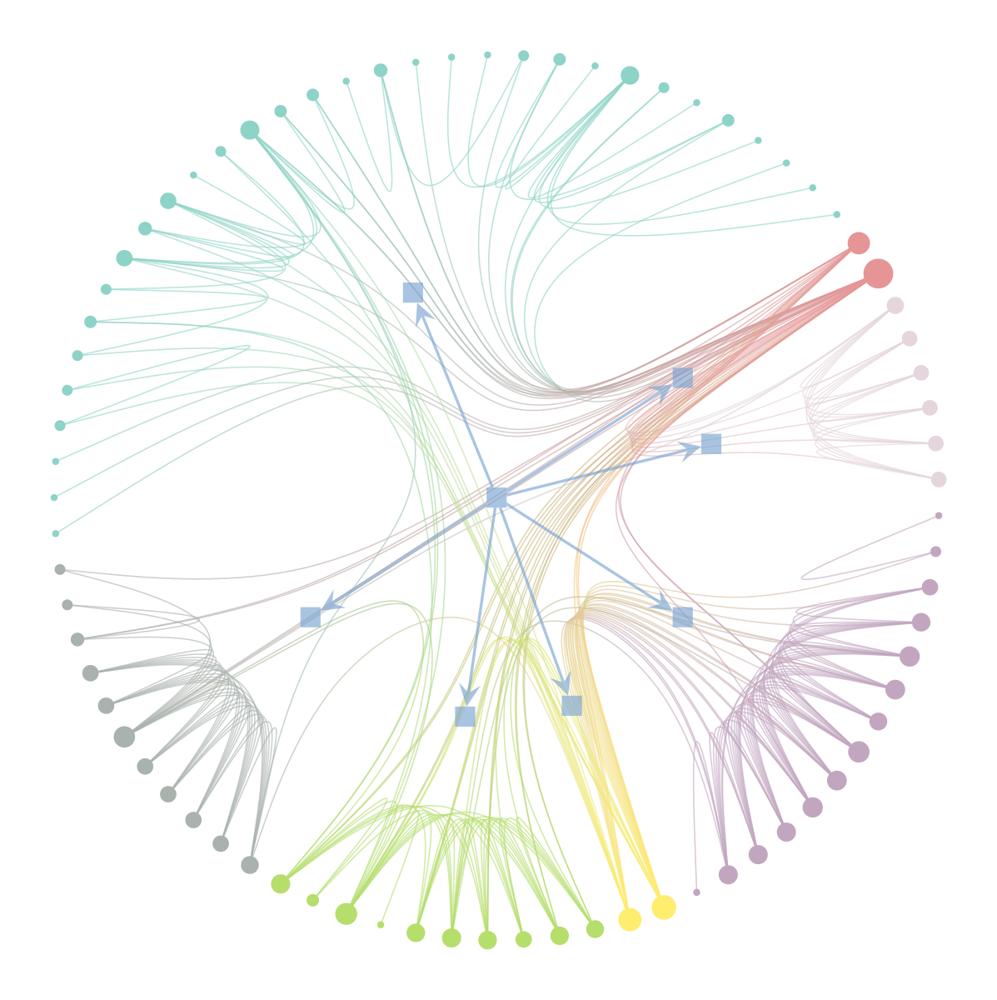

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x16930c7c0, at 0x1695ab970>,
 <Graph object, directed, with 85 vertices and 84 edges, at 0x1695cb220>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x1695cb220, at 0x1695abcd0>)

In [34]:
state = minimize_nested_blockmodel_dl(g)
print(state.entropy())
state.draw(pos=g.vp.pos)

699.5596833288256


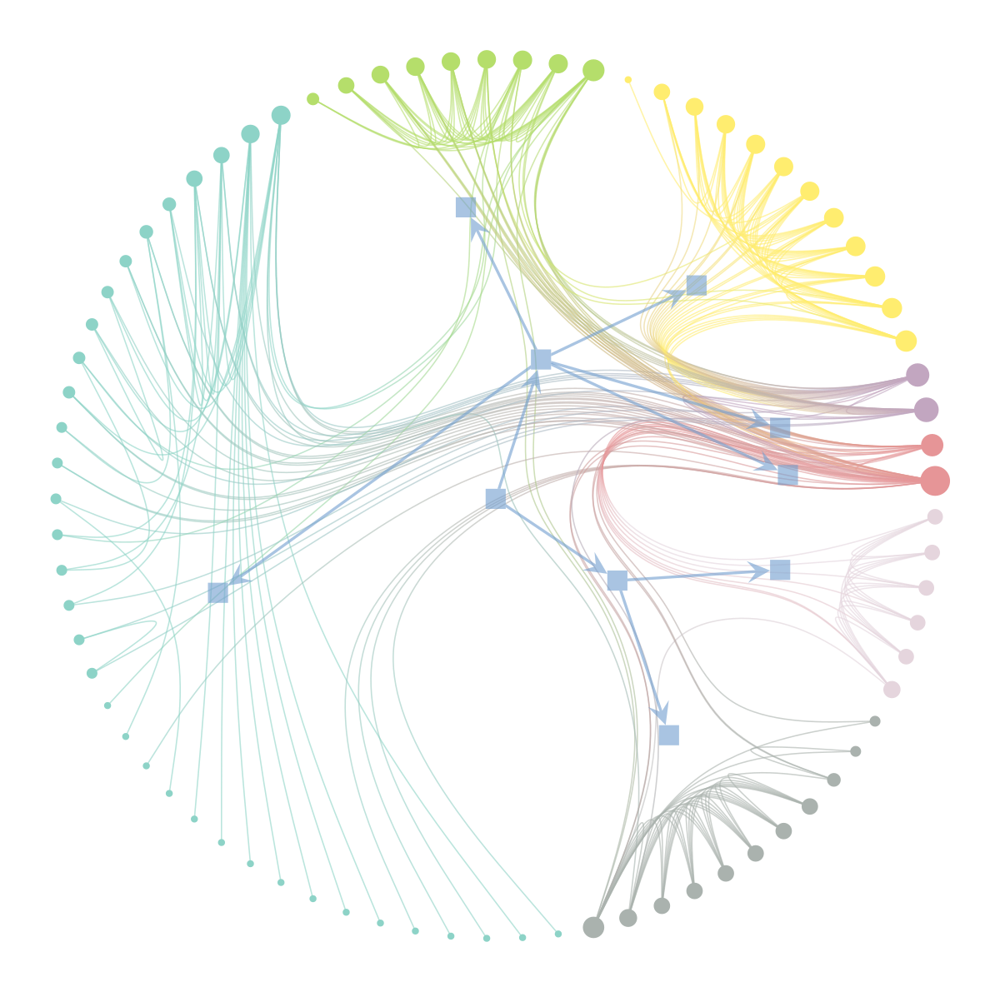

699.5596833288258


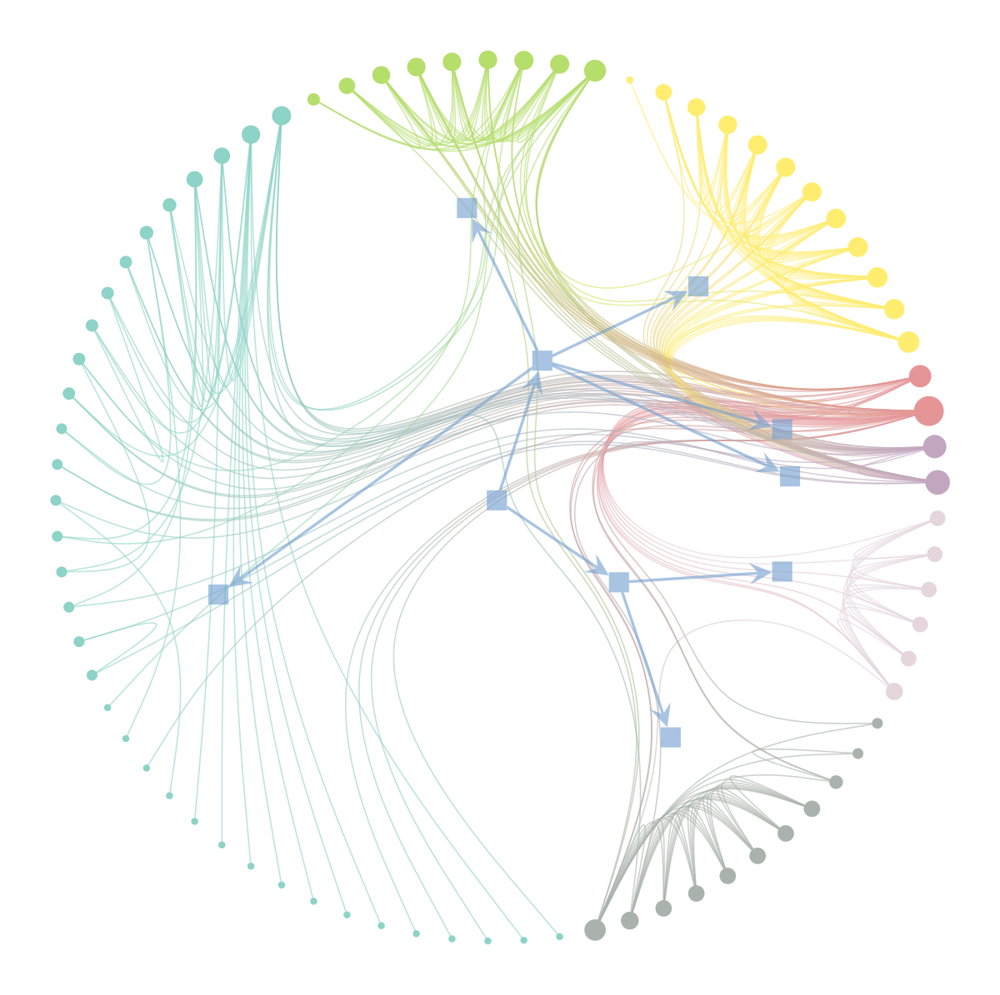

Improvement: 2.2737367544323206e-13


In [36]:
state = minimize_nested_blockmodel_dl(g)

S1 = state.entropy()
print(S1)
state.draw()

for i in range(1000): # this should be sufficiently large
    state.multiflip_mcmc_sweep(beta=np.inf, niter=10)

S2 = state.entropy()
print(S2)

state.draw()

print("Improvement:", S2 - S1)


In [60]:
state.print_summary()

l: 0, N: 105, B: 3
l: 1, N: 3, B: 1
l: 2, N: 1, B: 1


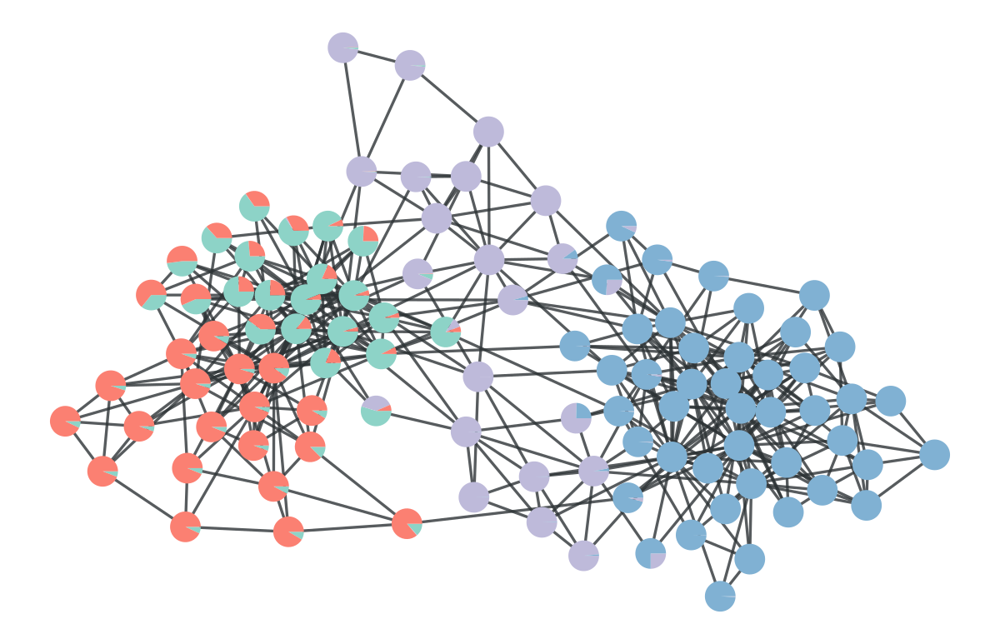

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x165f9fe20, at 0x1666c6940>

In [40]:
import numpy as np

np.random.seed(41)
seed_rng(41)
g = collection.data["polbooks"]
state = BlockState(g, B=4, deg_corr=True)
pv = None
state.mcmc_sweep(niter=1000)   # remove part of the transient

for i in range(1000):
     ret = state.mcmc_sweep(niter=10)
     pv = state.collect_vertex_marginals(pv)
mf_entropy(g, pv)
graph_draw(g, pos=g.vp["pos"], vertex_shape="pie",
               vertex_pie_fractions=pv)

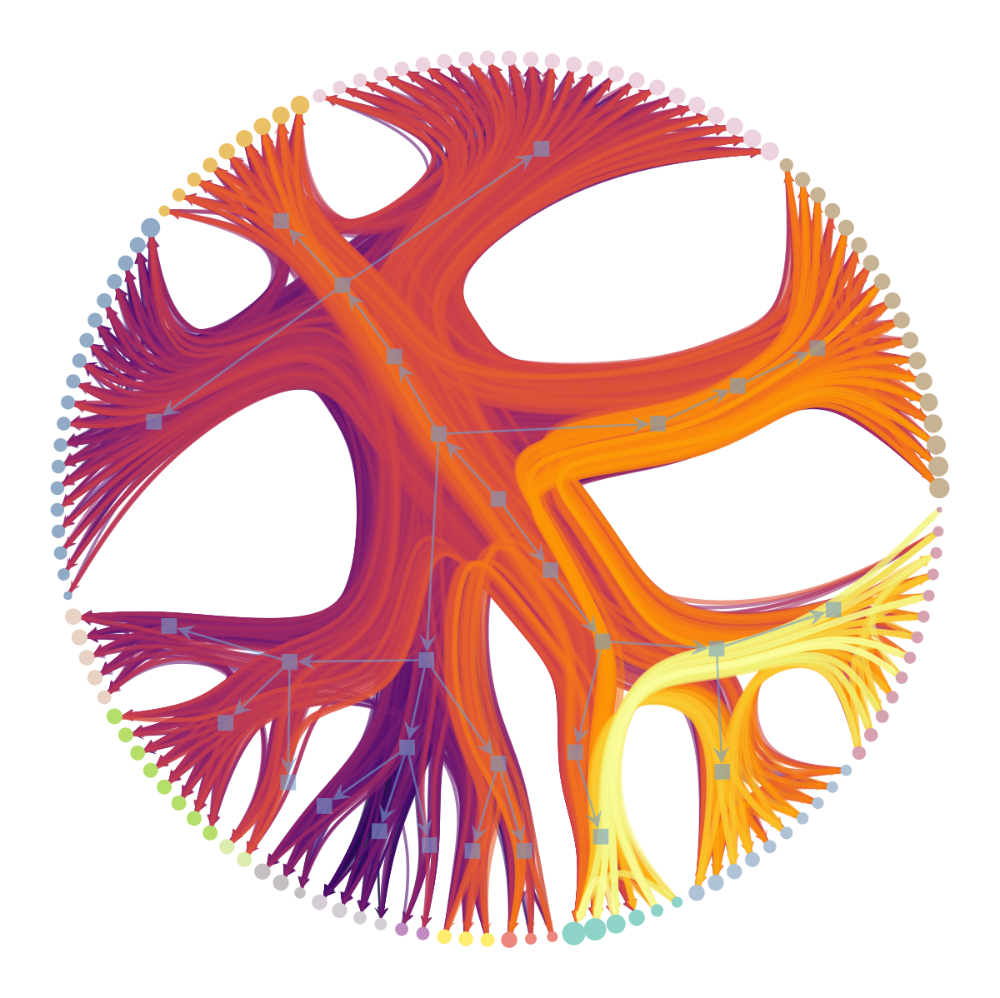

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x15ecd8bb0, at 0x15ef863a0>,
 <Graph object, directed, with 157 vertices and 156 edges, at 0x15f742ca0>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x15f742ca0, at 0x15f7799a0>)

In [26]:
import matplotlib
g = collection.ns["foodweb_baywet"]

# This network contains an internal edge property map with name
# "weight" that contains the energy flow between species. The values
# are continuous in the range [0, infinity].

state = minimize_nested_blockmodel_dl(g, state_args=dict(recs=[g.ep.weight],
                                                            rec_types=["real-exponential"]))

# improve solution with merge-split

for i in range(100):
    ret = state.multiflip_mcmc_sweep(niter=10, beta=np.inf)


state.draw(edge_color=prop_to_size(g.ep.weight, power=1, log=True), ecmap=(matplotlib.cm.inferno, .6),
           eorder=g.ep.weight, edge_pen_width=prop_to_size(g.ep.weight, 1, 4, power=1, log=True),
           edge_gradient=[])

<EdgePropertyMap object with value type 'double', for Graph 0x15ecd8bb0, at 0x1601095e0>
[5.217257e+00 7.388673e+01 8.589100e-02 ... 9.448903e-03 1.107325e-03
 5.173367e-03]


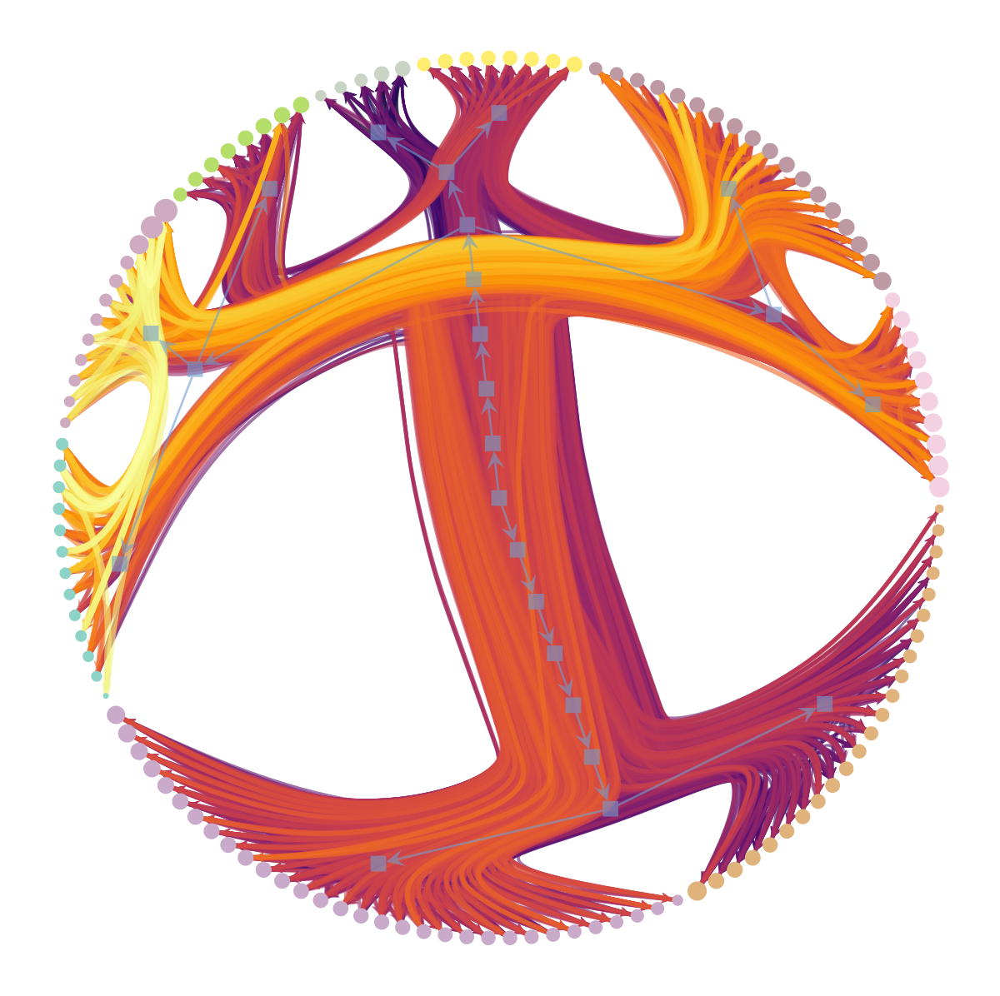

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x15ecd8bb0, at 0x1600ec3d0>,
 <Graph object, directed, with 152 vertices and 151 edges, at 0x15f050850>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x15f050850, at 0x15fe8d2b0>)

In [34]:
import numpy as np
y = g.ep.weight.copy()
print(y)
print(y.a)
y.a = np.log(y.a)

state_ln = minimize_nested_blockmodel_dl(g, state_args=dict(recs=[y],
                                                               rec_types=["real-normal"]))

# improve solution with merge-split

for i in range(100):
    ret = state_ln.multiflip_mcmc_sweep(niter=10, beta=np.inf)

state_ln.draw(edge_color=prop_to_size(g.ep.weight, power=1, log=True), ecmap=(matplotlib.cm.inferno, .6),
              eorder=g.ep.weight, edge_pen_width=prop_to_size(g.ep.weight, 1, 4, power=1, log=True),
              edge_gradient=[])


In [36]:
L1 = -state.entropy()
L2 = -state_ln.entropy() - np.log(g.ep.weight.a).sum()

print(L1," ",L2)
print(u"ln \u039b: ", L2 - L1)

7236.090132880678   7162.787411260748
ln Λ:  -73.3027216199298
